In [4]:
import pandas as pd
from statsmodels.graphics.mosaicplot import mosaic
import matplotlib.pyplot as plt
import numpy as np
from sklearn import decomposition
import seaborn as sn
from matplotlib import pyplot
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
pca = decomposition.PCA()

In [5]:
db = 'adult.data'
meta = 'adult.names'
cnames = []
with open(meta) as file:
    for line in (file.readlines()[-14:]):
        cnames.append(line.split(':')[0])
cnames.append("salary")
df = pd.read_csv(db, index_col = False, names = cnames, sep = ', ', engine = 'python')


In [6]:
df['education'].replace('Preschool', 'Below High School',inplace=True)
df['education'].replace('10th', 'Below High School',inplace=True)
df['education'].replace('11th', 'Below High School',inplace=True)
df['education'].replace('12th', 'Below High School',inplace=True)
df['education'].replace('1st-4th', 'Below High School',inplace=True)
df['education'].replace('5th-6th', 'Below High School',inplace=True)
df['education'].replace('7th-8th', 'Below High School',inplace=True)
df['education'].replace('9th', 'Below High School',inplace=True)
df['education'].replace('HS-Grad', 'High School',inplace=True)
df['education'].replace('HS-grad', 'High School',inplace=True)
df['education'].replace('Some-college', 'Community College',inplace=True)
df['education'].replace('Assoc-acdm', 'Community College',inplace=True)
df['education'].replace('Assoc-voc', 'Community College',inplace=True)
df['education'].replace('Bachelors', 'Bachelors',inplace=True)
df['education'].replace('Masters', 'Masters',inplace=True)
df['education'].replace('Prof-school', 'Masters',inplace=True)
df['education'].replace('Doctorate', 'Doctorate',inplace=True)

In [7]:
df['marital-status'].replace('Never-married', 'NotMarried',inplace=True)
df['marital-status'].replace(['Married-AF-spouse'], 'Married',inplace=True)
df['marital-status'].replace(['Married-civ-spouse'], 'Married',inplace=True)
df['marital-status'].replace(['Married-spouse-absent'], 'NotMarried',inplace=True)
df['marital-status'].replace(['Separated'], 'Separated',inplace=True)
df['marital-status'].replace(['Divorced'], 'Separated',inplace=True)
df['marital-status'].replace(['Widowed'], 'Widowed',inplace=True)

In [8]:
df_use = df.copy()
df_original = df.copy()
df

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,salary
0,39,State-gov,77516,Bachelors,13,NotMarried,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,<=50K
1,50,Self-emp-not-inc,83311,Bachelors,13,Married,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
2,38,Private,215646,High School,9,Separated,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
3,53,Private,234721,Below High School,7,Married,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
4,28,Private,338409,Bachelors,13,Married,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32556,27,Private,257302,Community College,12,Married,Tech-support,Wife,White,Female,0,0,38,United-States,<=50K
32557,40,Private,154374,High School,9,Married,Machine-op-inspct,Husband,White,Male,0,0,40,United-States,>50K
32558,58,Private,151910,High School,9,Widowed,Adm-clerical,Unmarried,White,Female,0,0,40,United-States,<=50K
32559,22,Private,201490,High School,9,NotMarried,Adm-clerical,Own-child,White,Male,0,0,20,United-States,<=50K


In [9]:
categorical_var = df.dtypes[df.dtypes == "object"].index
for item in categorical_var: # just for the categorical variables create dummy variables
    if item != 'salary':
        one_hot_train = pd.get_dummies(df[item])

        df = df.drop(item,axis = 1)
        one_hot_train = one_hot_train.add_suffix('_'+item) # add suffix to each value to deal with overlaps
        df = df.join(one_hot_train)

In [10]:
# labels = []
# for item in df['salary']:
#   if item =='<=50K':
#     labels.append(1)
#   else:
#     labels.append(0)

labels = list(df['salary'])
df = df.drop('salary',axis = 1)

In [11]:
pca.n_components = 3
pca_data = pca.fit_transform(df)
pca_data = np.vstack((pca_data.T,labels)).T
pca_df = pd.DataFrame(data = pca_data, columns=('1st_principal','2nd_principal','3rd_principal','label'))
print(pca_data.shape)

(32561, 4)


In [12]:
fig = px.scatter_3d(pca_df, x='1st_principal', y='2nd_principal', z='3rd_principal',
              color='label')

fig.show()

In [13]:

categorical_var = df_use.dtypes[df_use.dtypes == "object"].index
for item in categorical_var: # just for the categorical variables create dummy variables
    df_use[item] = df_use[item].astype('category')

cat_columns = df_use.select_dtypes(['category']).columns
df_use[cat_columns] = df_use[cat_columns].apply(lambda x: x.cat.codes)

In [14]:
len(df_use)

32561

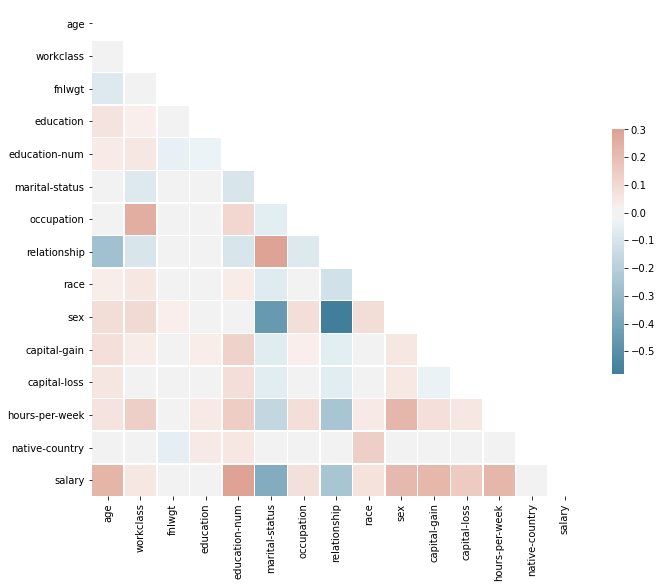

In [15]:
corr = df_use.corr()
mask = np.triu(np.ones_like(corr, dtype=bool))
f, ax = plt.subplots(figsize=(11, 9))
cmap = sn.diverging_palette(230, 20, as_cmap=True)
sn.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

/Users/wingman2.0/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:369: UserWarning:

Default bandwidth for data is 0; skipping density estimation.

/Users/wingman2.0/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:369: UserWarning:

Default bandwidth for data is 0; skipping density estimation.

/Users/wingman2.0/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:369: UserWarning:

Default bandwidth for data is 0; skipping density estimation.

/Users/wingman2.0/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:369: UserWarning:

Default bandwidth for data is 0; skipping density estimation.



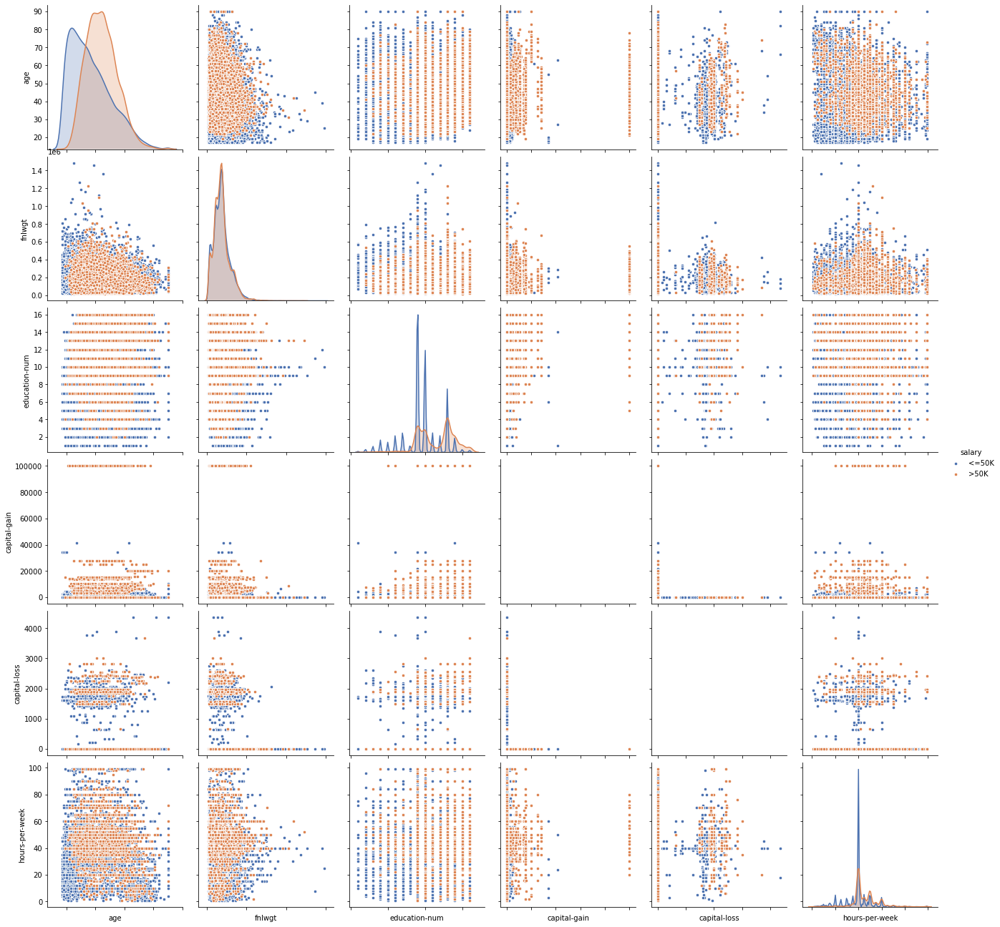

In [16]:
pp = sn.pairplot(df_original, hue = 'salary', palette = 'deep', 
                  height=3, diag_kind = 'kde', diag_kws=dict(shade=True), plot_kws=dict(s=20) )
pp.set(xticklabels=[])

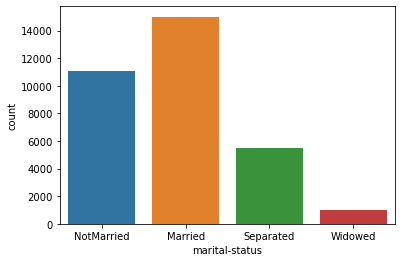

In [17]:
ax = sn.countplot(x="marital-status",data=df_original)
plt.rcParams['figure.figsize']=(10,10)

## Occupation Analysis

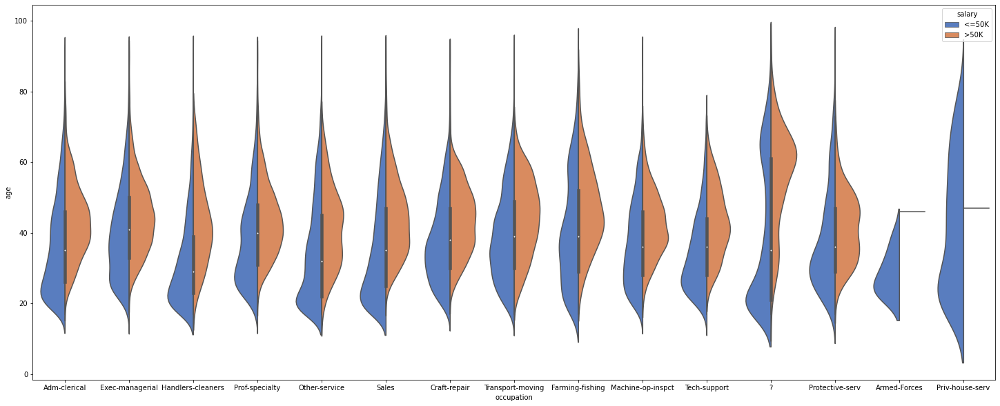

In [18]:
a4_dims = (25, 10)
fig, ax = pyplot.subplots(figsize=a4_dims)
ax = sn.violinplot(x="occupation", y="age", hue="salary",
                    data=df_original, gridsize=100, palette="muted", split=True, saturation=0.75)
ax

It can be noted that most of the senior workers have salary >50K. With Armed forces and Private house services do not have high paying salaries. 

While armed forces have lowest age distribution, Private home services has the highest. 



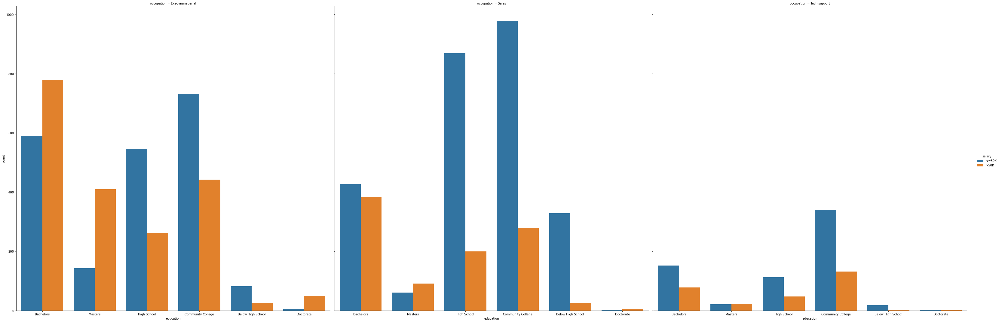

In [19]:
high_paying = ['Exec-managerial', 'Prof-speciality', 'Sales', 'Tech-support']
df_high_pay = df_original.loc[df_original['occupation'].isin(high_paying)]

g = sn.catplot(x="education", hue="salary", col="occupation",

                data=df_high_pay, kind="count",

                height=15, aspect=1);

In [20]:
df_low_managers = df_original.loc[(df_original['occupation'] == 'Exec-managerial') & (df_original['salary']  == '<=50K') & (df_original['education']  == 'Masters')]
df_low_managers

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,salary
5,37,Private,284582,Masters,14,Married,Exec-managerial,Wife,White,Female,0,0,40,United-States,<=50K
47,44,Private,128354,Masters,14,Separated,Exec-managerial,Unmarried,White,Female,0,0,40,United-States,<=50K
162,44,Self-emp-inc,78374,Masters,14,Separated,Exec-managerial,Unmarried,Asian-Pac-Islander,Female,0,0,40,United-States,<=50K
378,46,Self-emp-not-inc,80914,Masters,14,Separated,Exec-managerial,Not-in-family,White,Male,0,0,30,United-States,<=50K
566,43,Self-emp-inc,188436,Masters,14,Married,Exec-managerial,Husband,White,Male,5013,0,45,United-States,<=50K
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31052,20,Private,190227,Masters,14,NotMarried,Exec-managerial,Own-child,White,Male,0,0,25,United-States,<=50K
31053,44,Private,79864,Masters,14,Separated,Exec-managerial,Unmarried,White,Female,0,0,20,United-States,<=50K
31224,50,Federal-gov,111700,Masters,14,NotMarried,Exec-managerial,Not-in-family,White,Female,0,0,50,United-States,<=50K
31971,37,Self-emp-not-inc,338320,Masters,14,NotMarried,Exec-managerial,Not-in-family,White,Male,0,0,60,United-States,<=50K


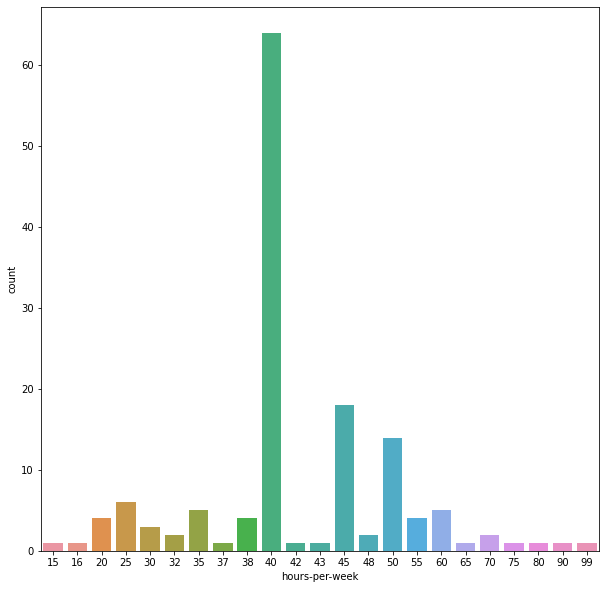

In [21]:
ax = sn.countplot(x="hours-per-week",data=df_low_managers)
plt.rcParams['figure.figsize']=(10,10)

It is interesting to see Executive managers with a Masters degree who put in more than 40hours per week getting paid less than 50K

In [22]:
df_mng_highwork = df_low_managers.loc[(df_low_managers['hours-per-week'] > 40)]
df_mng_highwork

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,salary
566,43,Self-emp-inc,188436,Masters,14,Married,Exec-managerial,Husband,White,Male,5013,0,45,United-States,<=50K
569,47,Private,87490,Masters,14,Separated,Exec-managerial,Unmarried,White,Male,0,0,42,United-States,<=50K
1467,49,Private,101320,Masters,14,Separated,Exec-managerial,Not-in-family,White,Female,0,0,75,United-States,<=50K
1675,43,Private,37937,Masters,14,Separated,Exec-managerial,Unmarried,White,Male,0,0,50,United-States,<=50K
1730,24,Private,180060,Masters,14,NotMarried,Exec-managerial,Own-child,White,Male,6849,0,90,United-States,<=50K
2651,43,Private,96102,Masters,14,NotMarried,Exec-managerial,Not-in-family,White,Male,0,0,50,United-States,<=50K
2989,44,Private,178385,Masters,14,Married,Exec-managerial,Husband,Asian-Pac-Islander,Male,0,0,48,India,<=50K
3667,37,Private,262409,Masters,14,Separated,Exec-managerial,Unmarried,White,Female,0,213,45,United-States,<=50K
6464,25,Private,181528,Masters,14,NotMarried,Exec-managerial,Not-in-family,White,Female,0,0,43,United-States,<=50K
6615,39,Private,182828,Masters,14,NotMarried,Exec-managerial,Not-in-family,White,Female,0,0,45,United-States,<=50K


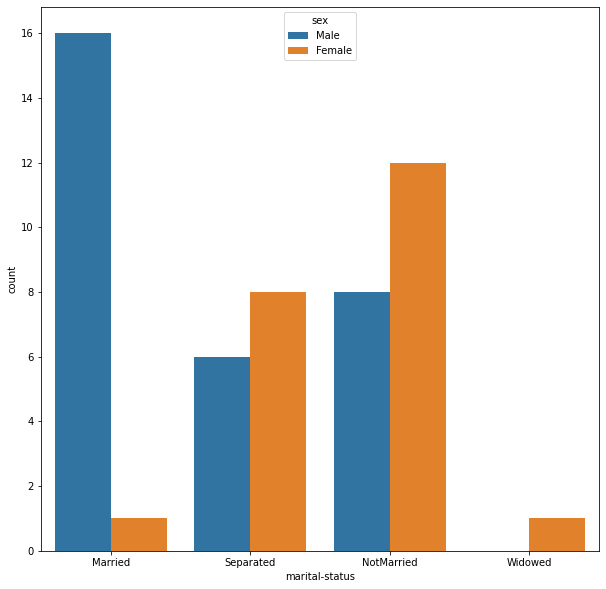

In [23]:
ax = sn.countplot(x="marital-status", hue="sex", data=df_mng_highwork)
plt.rcParams['figure.figsize']=(10,10)

## Gender Analysis

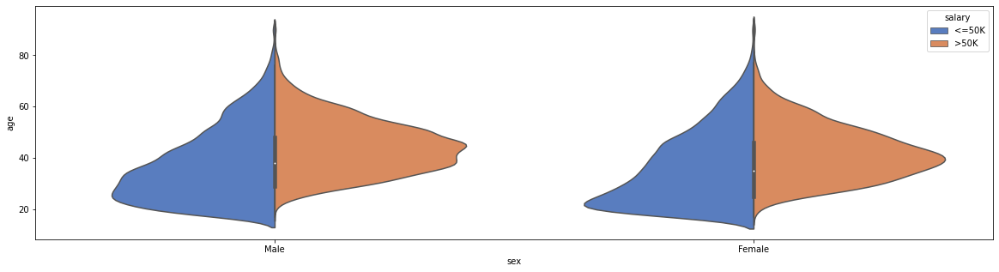

In [24]:
a4_dims = (20, 5)
fig, ax = pyplot.subplots(figsize=a4_dims)
ax = sn.violinplot(x="sex", y="age", hue="salary",
                    data=df_original, gridsize=100, palette="muted", split=True, saturation=0.75)
ax

In [25]:
fig = px.pie(df_original, names='sex', title="Gender Distribution in the Dataset")
fig.show()

## Marital Status Analysis

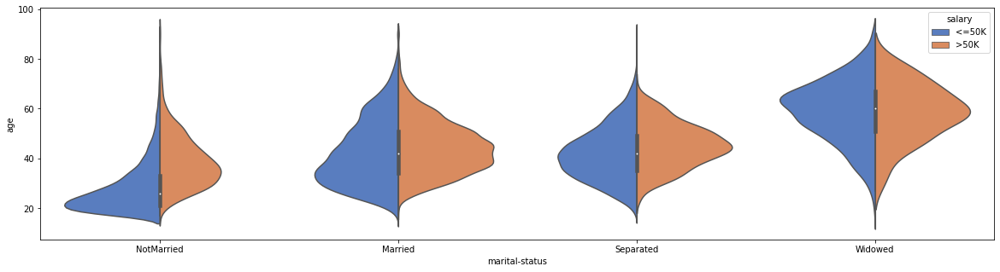

In [26]:
a4_dims = (20, 5)
fig, ax = pyplot.subplots(figsize=a4_dims)
ax = sn.violinplot(x="marital-status", y="age", hue="salary",
                    data=df_original, gridsize=100, palette="muted", split=True, saturation=0.75)
ax

The above chart indicates that many un-married people are earning >50k even before they hit 40s.



